In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings
to_ignore = "Geometry is in a geographic CRS. "
warnings.filterwarnings("ignore", message=to_ignore)

In [3]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from CENSAr.urban_scenarios import corrientes_stquo_2020

from CENSAr.spatial_features.urban_fabric import (
    UrbanFeatures
)
from CENSAr.spatial_features.geo_utils import (
    label_thiner_area_with_coarser_idx
)
from CENSAr.plots import (
    compare_chropleths,
    plot_grouped_bars
)

/home/fede/CEEU/CENSAr/venv/lib/python3.10/site-packages/libpysal/cg/alpha_shapes.py:39: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def nb_dist(x, y):
/home/fede/CEEU/CENSAr/venv/lib/python3.10/site-packages/libpysal/cg/alpha_shapes.py:165: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def get_faces(triangle):
/home/fede/CEEU/CENSAr/venv/lib/python3.10/site-p

## 1. Escenario de crecimiento

In [4]:
# raster data analysis outputs
path00 = '../../CENSAr/data/ManchaUrbana_Corrientes_1999.geojson'
path10 = '../../CENSAr/data/ManchaUrbana_Corrientes_2010.geojson'
path20 = '../../CENSAr/data/ManchaUrbana_Corrientes_2022.geojson'

In [5]:
# se carga el escenario de crecimiento urbano proyectado a 2020
urban_growth = corrientes_stquo_2020(path00, path10, path20, control_flow={'allocation_method':'avoid_relocations'})

[19:47:20] INFO     loading                                                                      ]8;id=57010;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/datasources.py\datasources.py]8;;\:]8;id=897898;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/datasources.py#112\112]8;;\
                    `https://storage.googleapis.com/python_mdg/censar_data/tipo_vivienda_radios_                   
                    corrientes_2001.csv`                                                                           

[19:47:21] INFO     loading                                                                      ]8;id=601355;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/datasources.py\datasources.py]8;;\:]8;id=797201;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/datasources.py#112\112]8;;\
                    `https://storage.googleapis.com/python_mdg/censar_data/tipo_vivienda_radios_                   
                    corrientes_2010.csv`                                                                           

[False]


[19:47:22] INFO     loadding                                                                     ]8;id=594590;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/datasources.py\datasources.py]8;;\:]8;id=797446;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/datasources.py#160\160]8;;\
                    `https://storage.googleapis.com/python_mdg/censar_data/corrientes_tracts_pai                   
                    ring_0110.csv`                                                                                 

           INFO     Applying named aggregation `tipo vivienda particular`                                ]8;id=966882;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py\core.py]8;;\:]8;id=838543;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py#67\67]8;;\

           WARNING  Extra columns found for mapping situacion de calle: {'persona viviendo en la        ]8;id=26645;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py\core.py]8;;\:]8;id=745837;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py#123\123]8;;\
                    calle'}. Extra columns will be ignored.                                                        

           INFO     Applying named aggregation `tipo vivienda particular`                                ]8;id=137551;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py\core.py]8;;\:]8;id=141113;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py#67\67]8;;\

           WARNING  Extra columns found for mapping formal: {'casa b', 'pieza en hotel o pension',      ]8;id=454460;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py\core.py]8;;\:]8;id=359555;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py#123\123]8;;\
                    'casa a'}. Extra columns will be ignored.                                                      

           WARNING  Extra columns found for mapping situacion de calle: {'persona viviendo en la        ]8;id=446674;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py\core.py]8;;\:]8;id=410952;file:///home/fede/CEEU/CENSAr/CENSAr/CENSAr/aggregation/core.py#123\123]8;;\
                    calle'}. Extra columns will be ignored.                                                        

In [6]:
tipo_vivienda_agg_2001, tipo_vivienda_agg_2010, tipo_vivienda_agg_2020 = urban_growth[2001], urban_growth[2010], urban_growth[2020]
footpr_corrientes_00, footpr_corrientes_10, footpr_corrientes_20 =  urban_growth['footpr01'], urban_growth['footpr10'], urban_growth['footpr20']

In [7]:
tipo_vivienda_agg_2020.head()

,link,link_2001,link_2010,formal,informal,total_viviendas,geometry
27430,180210201207,180211207,180211207,1484.0,475.0,1959,"MULTIPOLYGON (((-58.79193 -27.53047, -58.79132..."
29785,180210201212,180211207,180211212,397.0,238.0,635,"MULTIPOLYGON (((-58.82114 -27.51291, -58.82114..."
10741,180210201616,180211613,180211616,548.0,20.0,568,"MULTIPOLYGON (((-58.81872 -27.50869, -58.81776..."
10116,180210201615,180211616,180211615,447.0,27.0,474,"POLYGON ((-58.81330 -27.50807, -58.81192 -27.5..."
9424,180210202302,180211819,180212302,577.0,38.0,615,"POLYGON ((-58.80374 -27.50696, -58.80052 -27.5..."


{'cmap': 'YlOrRd', 'legend': True, 'legend_kwds': {'shrink': 0.3}}


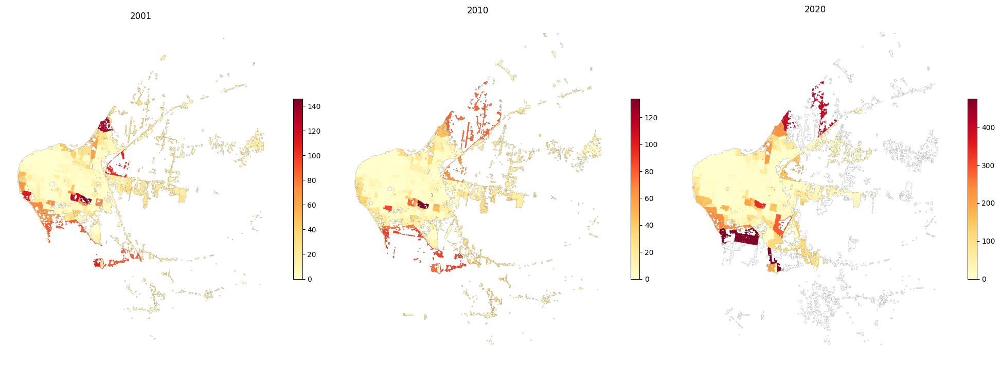

In [8]:
# Proyeccion de viviendas informales
compare_chropleths(
    tipo_vivienda_agg_2001,
    tipo_vivienda_agg_2010,
    tipo_vivienda_agg_2020,
    column=["informal","informal","informal"],
    titles=[2001, 2010, 2020],
    urban_boundaries = [footpr_corrientes_00, footpr_corrientes_10, footpr_corrientes_20],
    figsize=(20,12),
    cmap = 'YlOrRd'
)

{'scheme': 'NaturalBreaks', 'k': 4, 'cmap': 'YlOrRd', 'legend': True, 'legend_kwds': {'fmt': '{:.0f}'}}


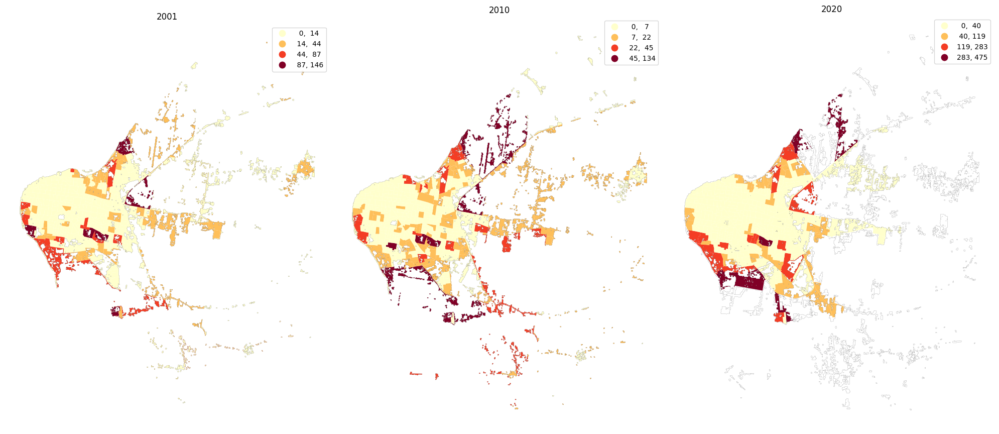

In [9]:
# Proyeccion de viviendas informales
compare_chropleths(
    tipo_vivienda_agg_2001,
    tipo_vivienda_agg_2010,
    tipo_vivienda_agg_2020,
    column=["informal","informal","informal"],
    titles=[2001, 2010, 2020],
    urban_boundaries = [footpr_corrientes_00, footpr_corrientes_10, footpr_corrientes_20],
    figsize=(20,12),
    legend_kwds = {'fmt':'{:.0f}'},
    scheme = "NaturalBreaks",
    k = 4,
    cmap = 'YlOrRd'
)

{'scheme': 'EqualInterval', 'k': 4, 'cmap': 'YlOrRd', 'legend': True, 'legend_kwds': {'fmt': '{:.0%}'}}


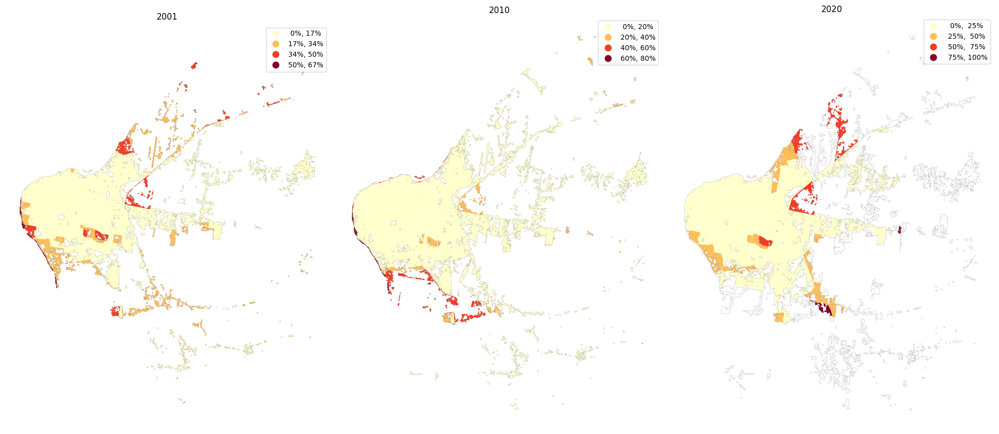

In [10]:
# En procentajes
tipo_vivienda_agg_2020['pct_informal'] = round((tipo_vivienda_agg_2020['informal']/tipo_vivienda_agg_2020['total_viviendas']),2)
tipo_vivienda_agg_2010['pct_informal'] = round((tipo_vivienda_agg_2010['informal']/tipo_vivienda_agg_2010['total']),2)
tipo_vivienda_agg_2001['pct_informal'] = round((tipo_vivienda_agg_2001['informal']/tipo_vivienda_agg_2001['total']),2)

compare_chropleths(
    tipo_vivienda_agg_2001,
    tipo_vivienda_agg_2010,
    tipo_vivienda_agg_2020,
    column=["pct_informal","pct_informal","pct_informal"],
    titles=[2001, 2010, 2020],
    urban_boundaries = [footpr_corrientes_00, footpr_corrientes_10, footpr_corrientes_20],
    figsize=(20,12),
    legend_kwds = {'fmt':'{:.0%}'},
    scheme = "EqualInterval",
    k = 4,
    cmap = 'YlOrRd'
)

{'cmap': 'YlOrRd', 'legend': True, 'legend_kwds': {'shrink': 0.3}}


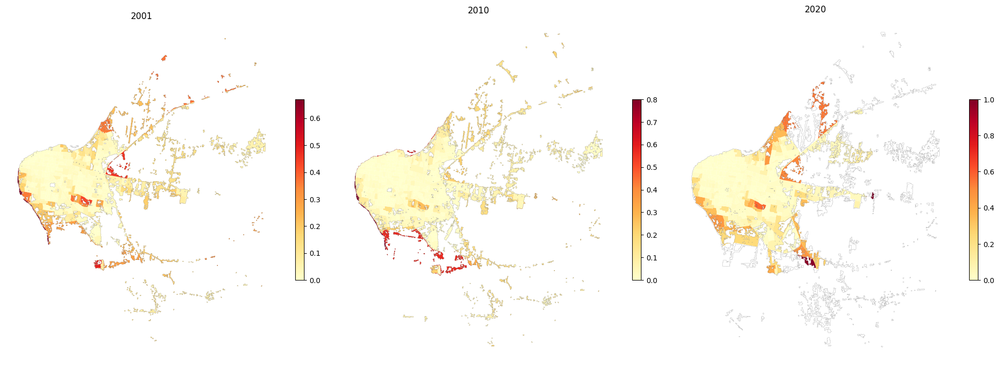

In [11]:
compare_chropleths(
    tipo_vivienda_agg_2001,
    tipo_vivienda_agg_2010,
    tipo_vivienda_agg_2020,
    column=["pct_informal","pct_informal","pct_informal"],
    titles=[2001, 2010, 2020],
    urban_boundaries = [footpr_corrientes_00, footpr_corrientes_10, footpr_corrientes_20],
    figsize=(20,12),
    cmap = 'YlOrRd'
)

# 2. Definición de las geometrías de nivel superior (coarser areas)

In [12]:
# Definicion del area superior
zones = gpd.read_file("../../CENSAr/data/zonas_corrientes.geojson")
zones = zones.iloc[:,[0,1,11]].copy()
zones.rename(columns={'Name':'barrio','descriptio':'grupo'},inplace=True)
nbhd = gpd.read_file("../../CENSAr/data/barrios_corrientes.shp")
nbhd = nbhd.iloc[:,[0,1,11]].copy()
nbhd.rename(columns={'Name':'barrio','descriptio':'grupo'},inplace=True)

In [14]:
# Asignamos la etiqueta de la geometría superior a los radios censales
territorio_inferior_2020 = label_thiner_area_with_coarser_idx(thiner_geom=tipo_vivienda_agg_2020.to_crs(4326), coarser_geom=zones)
territorio_inferior_2010 = label_thiner_area_with_coarser_idx(thiner_geom=tipo_vivienda_agg_2010, coarser_geom=zones)
territorio_inferior_2001 = label_thiner_area_with_coarser_idx(thiner_geom=tipo_vivienda_agg_2001, coarser_geom=zones)

In [15]:
# instancia un objeto de tipo "Ciudad"
corrientes_city_2020 = UrbanFeatures(thiner_area=territorio_inferior_2020, coarser_area=zones)
corrientes_city_2010 = UrbanFeatures(thiner_area=territorio_inferior_2010, coarser_area=zones)

# TODO: bugfix a la funcion etiqueta_de_area_superior
territorio_inferior_2001_ = territorio_inferior_2001.drop_duplicates(subset='link', keep='first', inplace=False).copy()
corrientes_city_2001 = UrbanFeatures(thiner_area=territorio_inferior_2001_, coarser_area=zones)

In [16]:
# Estimacion de la disimilitud espacial a nivel administrativo superior
coarser_area_2020 = corrientes_city_2020.spatial_dissimilarity(
    idx_coarser_area='grupo', 
    var_name='total_viviendas', 
    cat_name='informal'
    )['coarser_dissim']

coarser_area_2010 = corrientes_city_2010.spatial_dissimilarity(
    idx_coarser_area='grupo', 
    var_name='total', 
    cat_name='informal'
    )['coarser_dissim']

coarser_area_2001 = corrientes_city_2001.spatial_dissimilarity(
    idx_coarser_area='grupo', 
    var_name='total', 
    cat_name='informal'
    )['coarser_dissim']

## 3. Disimilitud en el año de proyección (2020)

In [17]:
corrientes_city_2020.interactive_dissimilarity_index( 
    idx_coarser_area='grupo', 
    idx_thiner_area='link',
    var_name='total_viviendas', 
    cat_name='informal',
    chart='choroplet'
    )

## 4. Disimilitud en el periodo de expansion urbana

## 2020

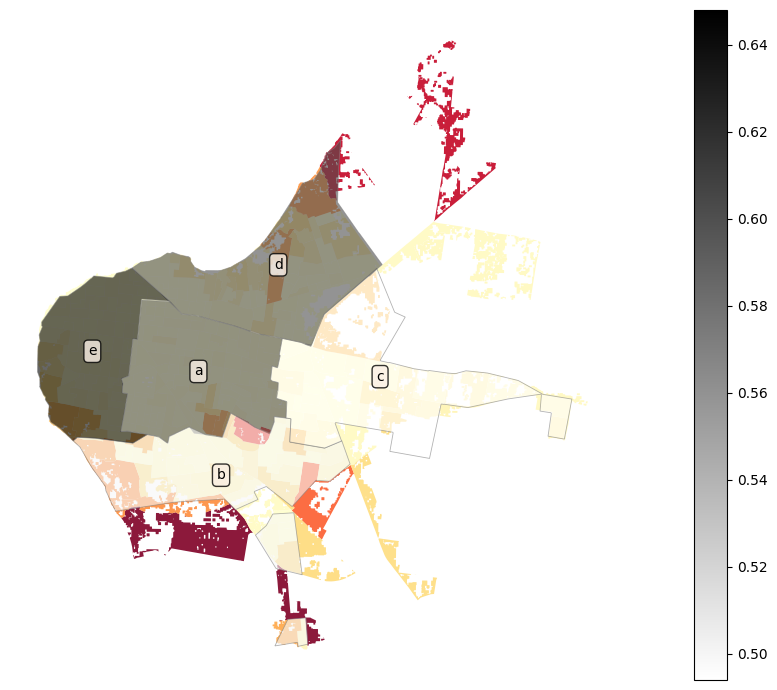

In [18]:
corrientes_city_2020.noninteractive_dissimilarity_index( 
    idx_coarser_area='grupo', 
    var_name='total_viviendas', 
    cat_name='informal',
    chart='choroplet'
    )

## 2010

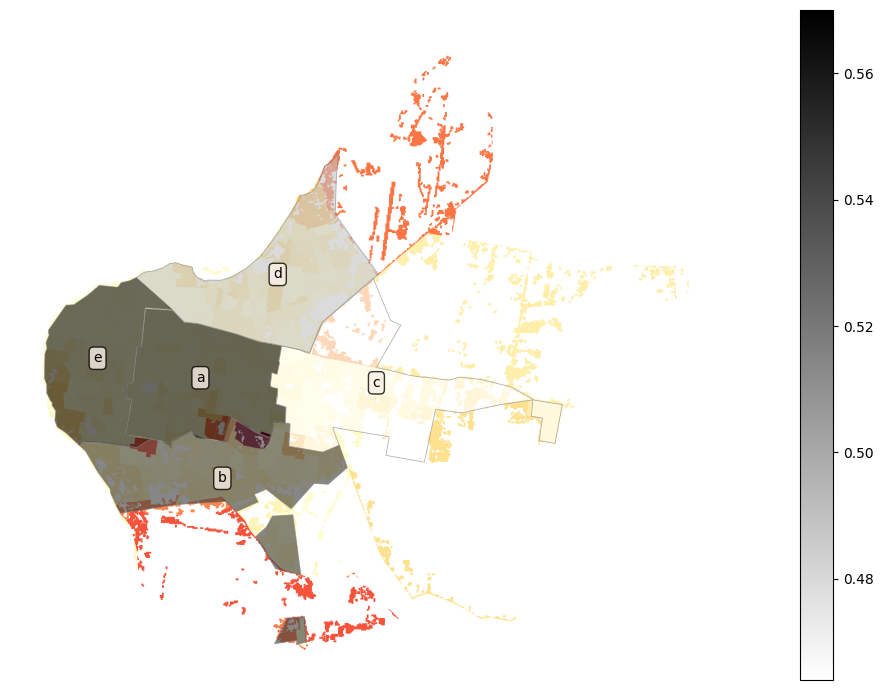

In [19]:
corrientes_city_2010.noninteractive_dissimilarity_index( 
    idx_coarser_area='grupo', 
    var_name='total', 
    cat_name='informal',
    chart='choroplet'
    )

## 2001

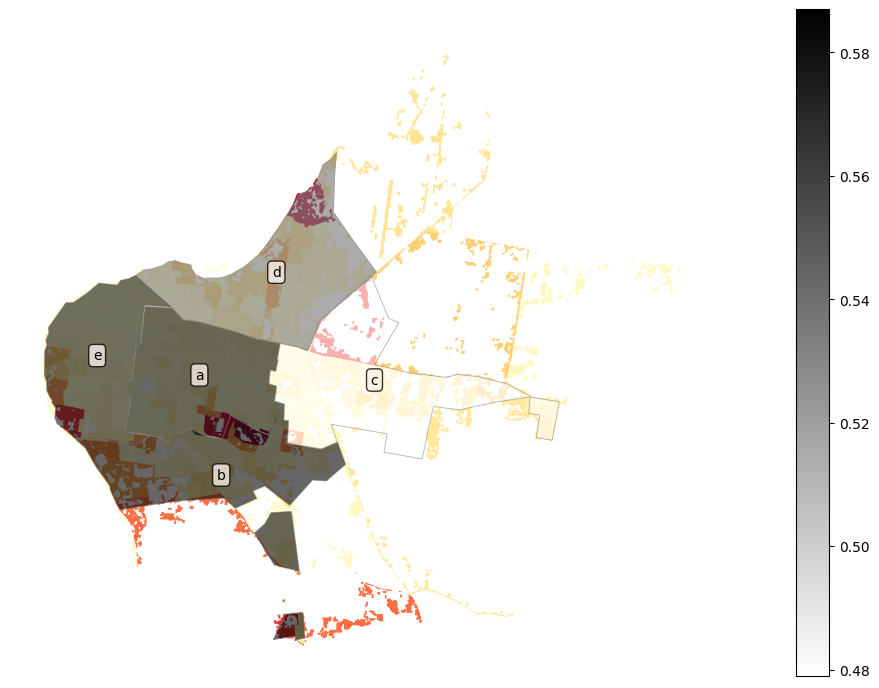

In [20]:
corrientes_city_2001.noninteractive_dissimilarity_index( 
    idx_coarser_area='grupo', 
    var_name='total', 
    cat_name='informal',
    chart='choroplet'
    )

# 5. Crecimiento del area urbana y el nivel de disimilitud 

In [21]:
zonas_2020 = coarser_area_2020[['grupo','dissim_idx_informal']].T.reset_index()
zonas_2020.iloc[0,0] = 'año'
zonas_2020.iloc[1,0] = '2020'
zonas_2020.columns=zonas_2020.iloc[0]
zonas_2020 = zonas_2020.iloc[1:]

zonas_2001 = coarser_area_2001[['grupo','dissim_idx_informal']].T.reset_index()
zonas_2001.iloc[0,0] = 'año'
zonas_2001.iloc[1,0] = '2001'
zonas_2001.columns=zonas_2001.iloc[0]
zonas_2001 = zonas_2001.iloc[1:]

df = pd.concat([zonas_2020, zonas_2001])
df.set_index('año', inplace=True)

In [22]:
df

,a,b,c,d,e
año,,,,,
2020,0.603,0.499,0.494,0.602,0.648
2001,0.585,0.587,0.479,0.538,0.58


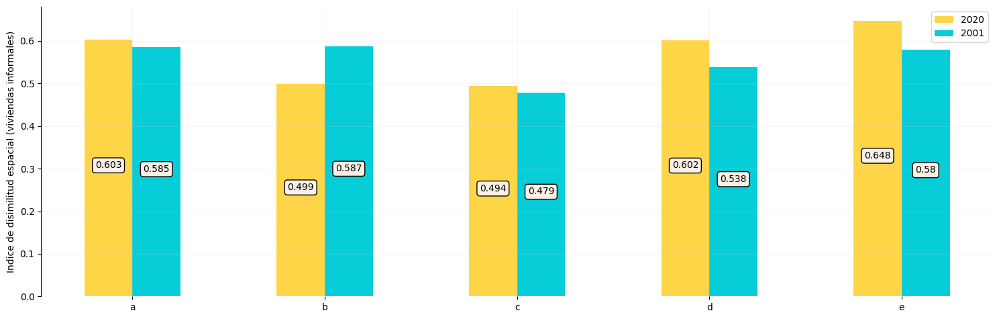

In [23]:
yaxis_formatter=None
xaxis_formatter=None
xticks_rotation = 0

fcolor = 'linen'
tcolor = 'black'

colors = {'2001':'#07cdd8',
          '2020':'#fed547' 
          }
len_groups = 5
bar_width = 0.25

yaxis_name = 'Indice de disimilitud espacial (viviendas informales)'
ylim = None
chart_title = None
figsize=(15,5)

plot_grouped_bars(df, figsize, chart_title, len_groups, bar_width, colors, fcolor, tcolor, yaxis_name, yaxis_formatter, ylim, xaxis_formatter, xticks_rotation)

In [24]:
km2_2020 = round(footpr_corrientes_20.to_crs(5347).geometry.area.sum()*0.000001, 2)
dis_indx_20 = round(coarser_area_2020['dissim_idx_informal'].mean(),3)
km2_2010 = round(footpr_corrientes_10.to_crs(5347).geometry.area.sum()*0.000001, 2)
dis_indx_10 = round(coarser_area_2010['dissim_idx_informal'].mean(),3)
km2_2001 = round(footpr_corrientes_00.to_crs(5347).geometry.area.sum()*0.000001, 2)
dis_indx_01 = round(coarser_area_2001['dissim_idx_informal'].mean(),3)

In [25]:
df = pd.DataFrame(
    {'año':[2020,2010,2001], 
    'area (km2)':[km2_2020,km2_2010,km2_2001], 
    'indice de disimilitud':[dis_indx_20, dis_indx_10, dis_indx_01]}                   
)
df['crecimiento (en % año base)'] = df["area (km2)"].apply(lambda x: round((x/km2_2001)*100),2)
df

,año,area (km2),indice de disimilitud,crecimiento (en % año base)
0,2020,97.39,0.569,153
1,2010,71.75,0.528,113
2,2001,63.54,0.554,100


In [26]:
import seaborn as sns
sns.set_theme(style="whitegrid")

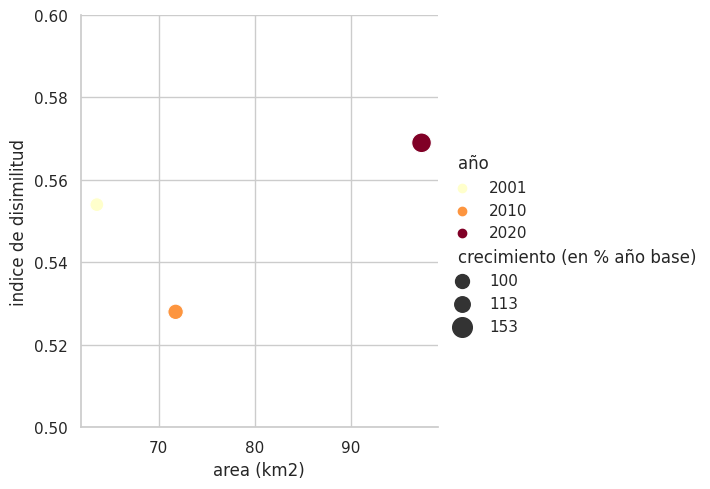

In [27]:
sns.relplot(
    data=df,
    x="area (km2)", 
    y="indice de disimilitud",
    hue="año", 
    size="crecimiento (en % año base)", 
    palette='YlOrRd', 
    sizes=(100,200)
)
plt.ylim(0.5,0.6);

(0.5, 0.6)

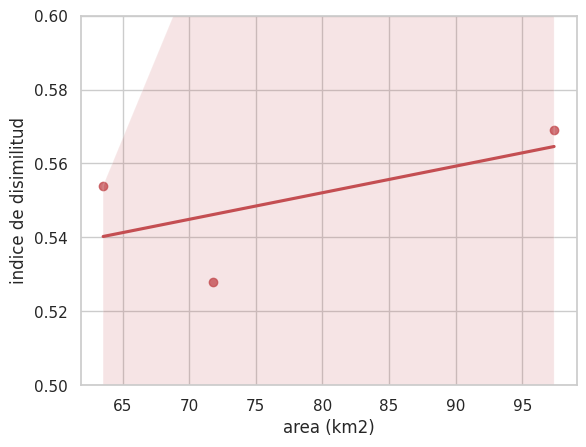

In [28]:
g = sns.regplot(
    data=df,
    x="area (km2)", 
    y="indice de disimilitud",
    color='r'
    )
plt.ylim(0.5,0.6)